In [1]:
from semdiffusers import SemanticEditPipeline
import torch
torch.cuda.empty_cache()
device='cuda'

pipe = SemanticEditPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    
    safety_checker=None,
).to(device)
gen = torch.Generator(device=device)

2023-07-24 14:12:52.947744: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-07-24 14:12:59.572716: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-24 14:13:16.305338: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/nfshomes/dyang5/CAAR/lib/python3.11/site-packages/semdiffusers/pipeline_latent_edit_diffusion.py:12: FutureWarning: Importing `DiffusionPipeline` or `ImagePipelineOutput` from diffusers.pipeline_utils is deprecated. Please import from diffusers.pipe

In [2]:
from PIL import Image
def image_grid(imgs, rows, cols, spacing = 20):
    assert len(imgs) == rows * cols
    
    w, h = imgs[0].size
    
    grid = Image.new('RGBA', size=(cols * w + (cols-1)*spacing, rows * h + (rows-1)*spacing ), color=(255,255,255,0))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=( i // rows * (w+spacing), i % rows * (h+spacing)))
        #print(( i // rows * w, i % rows * h))
    return grid

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

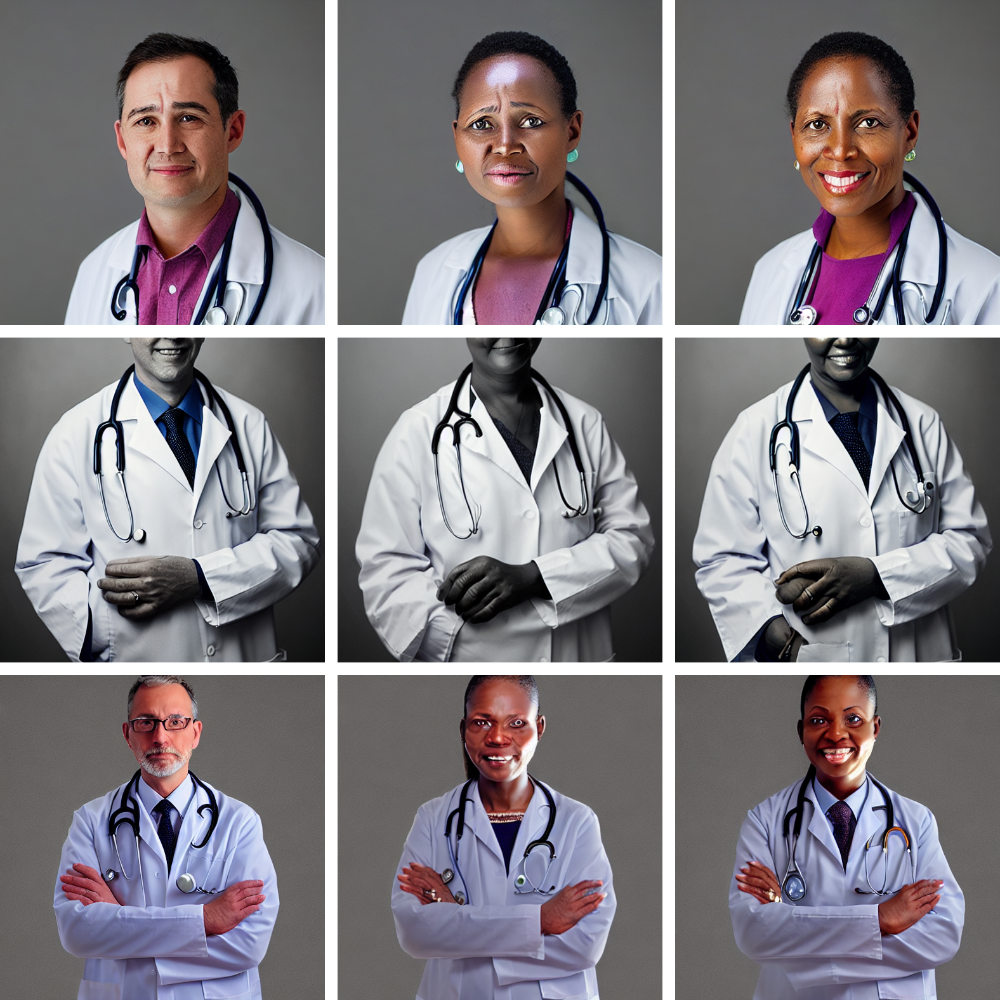

In [6]:
imgs = []
target = {'editing_prompt': ['african', 'female', 'male'], 'reverse_editing_direction':[False, False, True], 
          'edit_warmup_steps':10, 'edit_guidance_scale':6, 'edit_threshold':0.95, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

target2 = {'editing_prompt': ['african', 'female', 'male', 'deformed', 'blurry'], 'reverse_editing_direction':[False, False, True, True, True], 
          'edit_warmup_steps':10, 'edit_guidance_scale':6, 'edit_threshold':0.95, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

seed = 5
prompt = 'a portrait photo of a doctor'
gen.manual_seed(seed)
org = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5)
imgs.extend(org.images)

gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5,
       **target)
imgs.extend(out.images)

gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5,
       **target2)
imgs.extend(out.images)

image_grid(imgs, rows=3, cols=3)

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

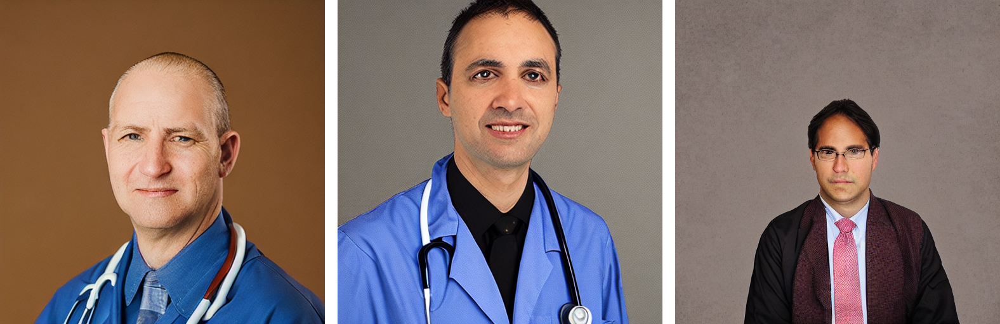

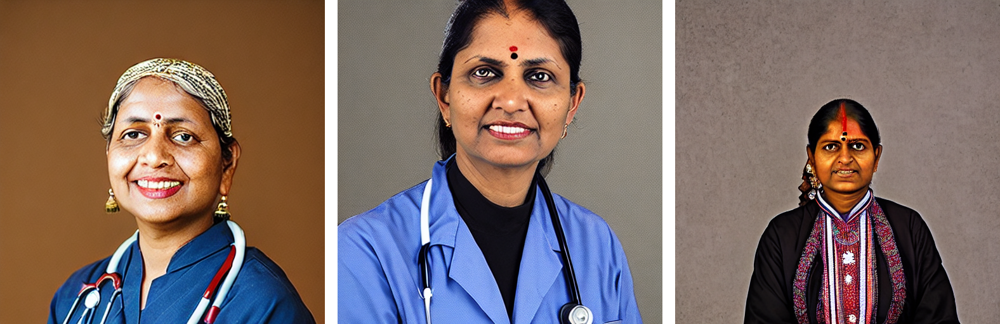

In [7]:
imgs = []

target = {'editing_prompt': ['indian', 'female', 'male', 'deformed', 'blurry'], 'reverse_editing_direction':[False, False, True, True, True], 
          'edit_warmup_steps':10, 'edit_guidance_scale':6, 'edit_threshold':0.95, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

seed = 42
prompt = 'a portrait photo of a doctor'
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5)
orig_imgs = out.images

gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5,
       **target)
imgs = out.images

display(image_grid(orig_imgs, 1, len(orig_imgs)))
display(image_grid(imgs, 1, len(imgs)))

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

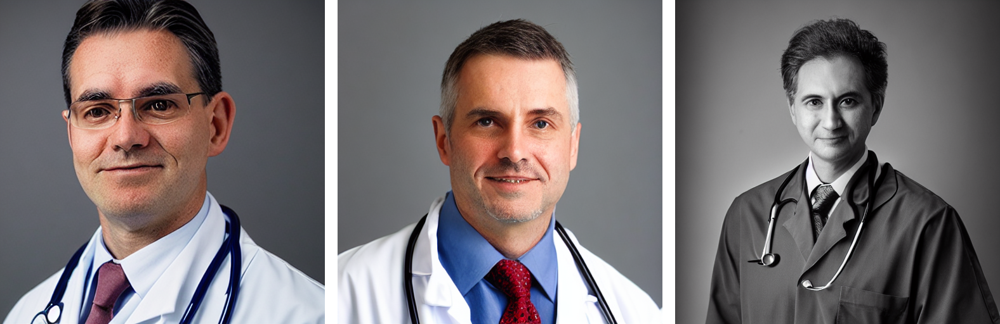

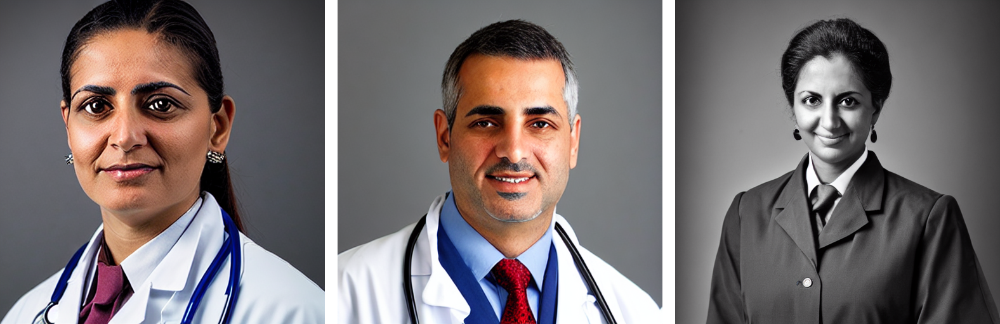

In [8]:
imgs = []

target = {'editing_prompt': ['middle eastern', 'female', 'male', 'deformed', 'blurry'], 'reverse_editing_direction':[False, False, True, True, True], 
          'edit_warmup_steps':10, 'edit_guidance_scale':6, 'edit_threshold':0.95, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

seed = 21
prompt = 'a portrait photo of a doctor'
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5)
orig_imgs = out.images

gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5,
       **target)
imgs = out.images

display(image_grid(orig_imgs, 1, len(orig_imgs)))
display(image_grid(imgs, 1, len(imgs)))

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

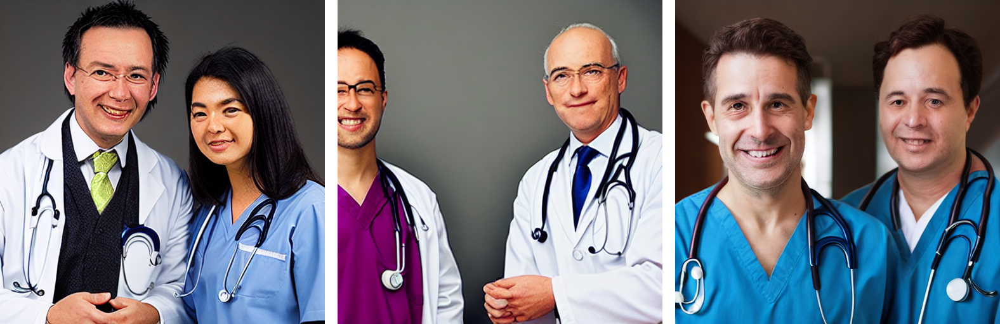

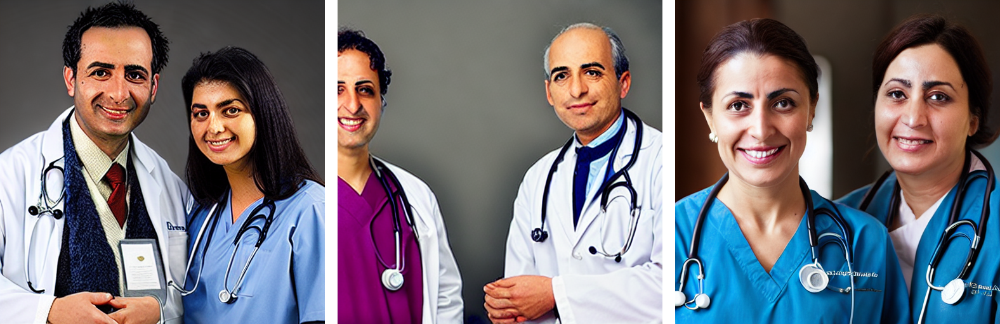

In [9]:
imgs = []

target = {'editing_prompt': ['middle eastern', 'female', 'male', 'deformed', 'blurry'], 'reverse_editing_direction':[False, False, True, True, True], 
          'edit_warmup_steps':10, 'edit_guidance_scale':6, 'edit_threshold':0.95, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

seed = 21
prompt = 'a photo of two doctors'
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5)
orig_imgs = out.images

gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=3, guidance_scale=7.5,
       **target)
imgs = out.images

display(image_grid(orig_imgs, 1, len(orig_imgs)))
display(image_grid(imgs, 1, len(imgs)))